## Business Self Santioning Against Russia
### Elina Ribakova, Diana Morris, Carol Moore

In [1]:
import pandas as pd
import openpyxl
from sklearn.preprocessing import LabelEncoder, Normalizer, StandardScaler
import numpy as np
import pymc3 as pm
import theano.tensor as tt
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import os

In [160]:
pd.set_option('display.max_columns', 80) #display a maximumn of 10 columns
pd.set_option('display.max_rows', 189) #display a maximumn of 10 rows

In [161]:
data = pd.read_excel('SelfSanctions_LeaveRussia_July31.xlsx', sheet_name = 'Data-Companies Leave Russia', header = 1, nrows=2479 )

# Clean and code data

## Response Variable

In [162]:
data['Status by KSE'].value_counts(dropna=False)

leave     1126
stay       750
wait       469
0           91
exited      43
Name: Status by KSE, dtype: int64

In [163]:
#Recode 

data['Status by KSE'].replace({"returned": "2_stay"}, inplace=True)
data['Status by KSE'].replace({"stay": "2_stay"}, inplace=True)
data['Status by KSE'].replace({0.0: "unverified"}, inplace=True)
data['Status by KSE'].replace({"leave": "0_leave"}, inplace=True)
data['Status by KSE'].replace({"exited": "0_leave"}, inplace=True)
data['Status by KSE'].replace({"wait": "1_wait"}, inplace=True)
data['Status by KSE'].value_counts()

0_leave       1169
2_stay         750
1_wait         469
unverified      91
Name: Status by KSE, dtype: int64

In [164]:
# Drop unverified status and NA values

data=data[~(data['Status by KSE']=='unverified')]
data = data[data['Status by KSE'].notna()]
data.shape

(2388, 65)

In [165]:
#data.info()

## Discard unneeded columns and rename

We eliminate uninformative variables and those that have too few valid values to  useful in a regression.

In [166]:
mycol = ['Company name', 'Country of HQ', 'Industry',
       'Description of operations curtailed', 'Date of status update',
       'Status of decision', 'Status of decision 17/03',
       'Status of decision 24/03',
       'Status of decision 31/03', 
       'Status of decision 07/04', 
       'Status of decision 14/04', 
       'Status of decision 21/04', 
       'Status of decision 28/04', 
       'Status of decision 05/05', 
       'Status of decision 12/05', 
       'Status of decision 19/05', 
       'Status of decision 29/05', 
       'Status of decision 02/06', 
       'Status of decision 09/06', 
       'Status of decision 16/06', 
       'Status of decision 23/06', 
       'Status of decision 30/06', 
       'Status of decision 07-31/07', 
       'Status by KSE', 'Number of staff', 
       'Revenue in RF, USD m', 'Global Revenue, USD m',
       '% of revenue in RF vs Global']

In [167]:
data=data[mycol]
data.head()

,Company name,Country of HQ,Industry,Description of operations curtailed,Date of status update,Status of decision,Status of decision 17/03,Status of decision 24/03,Status of decision 31/03,Status of decision 07/04,Status of decision 14/04,Status of decision 21/04,Status of decision 28/04,Status of decision 05/05,Status of decision 12/05,Status of decision 19/05,Status of decision 29/05,Status of decision 02/06,Status of decision 09/06,Status of decision 16/06,Status of decision 23/06,Status of decision 30/06,Status of decision 07-31/07,Status by KSE,Number of staff,"Revenue in RF, USD m","Global Revenue, USD m",% of revenue in RF vs Global
0,1Password,Canada,Finance and payments,Halted creation of new accounts and renewal pa...,2022-03-15 00:00:00,Active,SCALING BACK – Reducing Current Operations/Hol...,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,1_wait,NaN,NaN,NaN,NaN
1,3M,USA,FMCG,suspend operations in Russia,2022-03-31 00:00:00,Active,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,0_leave,809,220.0,35355.0,0.0062
2,Aalberts,Netherlands,Manufacturing,less than 11% of revenue from Russia,2022-03-31 00:00:00,Active,NaN,NaN,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,1_wait,NaN,NaN,3149.5,NaN
3,Aarsleff,Denmark,Construction & Architecture,have taken the decision to sell their business...,2022-03-31 00:00:00,Active,NaN,"WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean B

In [168]:
data = data.rename({'Company name': 'name', 
                'Country of HQ': 'country', 
                'Industry':'Industry',
                'Description of operations curtailed': 'description',
                'Date of status update': 'date',
                'Status of decision': 'status_current', 
                'Status of decision 17/03': 'status 3/17', 
              
                'Status of decision 24/03': 'status 3/24',
               
                'Status of decision 31/03': 'status 3/31',
                
                'Status of decision 07/04': 'status 4/7',
                'Status of decision 14/04': 'status 4/14', 
                'Status of decision 21/04': 'status 4/21',
                'Status of decision 28/04': 'status 4/28',
                'Status of decision 05/05': 'status 5/5',
                'Status of decision 12/05': 'status 5/12',
                'Status of decision 19/05': 'status 5/19',
                'Status of decision 29/05': 'status 5/29',
                'Status of decision 02/06': 'status 6/2',              
                'Status of decision 09/06': 'status 6/9',            
                'Status of decision 16/06': 'status 6/16',             
                'Status of decision 23/06': 'status 6/23',              
                'Status of decision 30/06': 'status 6/30',         
                'Status of decision 07-31/07': 'status 7/31', 
                'Status by KSE': 'status', 
                'Number of staff' : 'staff', 
                'Revenue in RF, USD m': 'RU_revenue',
                'Global Revenue, USD m': 'global_revenue',
                '% of revenue in RF vs Global': 'RU_revenue_to_global'}, 
               axis = 1)

data.head()

,name,country,Industry,description,date,status_current,status 3/17,status 3/24,status 3/31,status 4/7,status 4/14,status 4/21,status 4/28,status 5/5,status 5/12,status 5/19,status 5/29,status 6/2,status 6/9,status 6/16,status 6/23,status 6/30,status 7/31,status,staff,RU_revenue,global_revenue,RU_revenue_to_global
0,1Password,Canada,Finance and payments,Halted creation of new accounts and renewal pa...,2022-03-15 00:00:00,Active,SCALING BACK – Reducing Current Operations/Hol...,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,1_wait,NaN,NaN,NaN,NaN
1,3M,USA,FMCG,suspend operations in Russia,2022-03-31 00:00:00,Active,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,0_leave,809,220.0,35355.0,0.0062
2,Aalberts,Netherlands,Manufacturing,less than 11% of revenue from Russia,2022-03-31 00:00:00,Active,NaN,NaN,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,1_wait,NaN,NaN,3149.5,NaN
3,Aarsleff,Denmark,Construction & Architecture,have taken the decision to sell their business...,2022-03-31 00:00:00,Active,NaN,"WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...",0_leave,50,8.0,NaN,NaN
4,AB Electrolux,Sweden,Electronics,cut Russia operations and trade,2022

## Consolidate Industry Groupings

In [170]:
#Consolidated

industry_alt={'Industry':{"Advertising, PR":"Professional Services",
"Aerospace":"Industrials",
"Agriculture":"Consumer staples",
"Air transportation":"Transportation and Logistics",
"Aircraft industry":"Industrials",
"Alcohol&Tobacco":"Consumer staples",
"Analytics":"Professional Services",
"Аssociation, NGO":"Professional Services",
"Automotive":"Consumer Cyclical",
"Certification":"Professional Services",
"Chemical industry":"Industrials",
"Conglomerate":"Industrials",
"Construction & Architecture":"Construction and Real Estate",
"Consulting, Law":"Professional Services",
"Consumer goods and clothing":"Consumer Cyclical",
"Culture and art":"Consumer Cyclical",
"Defense":"Industrials",
"Electronics":"Electronics and Technology",
"Energy, oil and gas":"Natural Resources and Public Goods",
"Engineering":"Professional Services",
"Entertainment":"Consumer Cyclical",
"Events, Education":"Consumer Cyclical",
"Fashion and leisure":"Consumer Cyclical",
"Films":"Consumer Cyclical",
"Finance and payments":"Financial",
"FMCG":"Consumer staples",
"Food&Beverages":"Consumer staples",
"Gaming":"Consumer Cyclical",
"Hospitality, Real estate":"Construction and Real Estate",
"Industrial equipment":"Industrials",
"Insurance":"Financial",
"IT":"Electronics and Technology",
"Leasing, rental":"Construction and Real Estate",
"Logistics, Transport":"Transportation and Logistics",
"Luxury":"Consumer Cyclical",
"Manufacturing":"Industrials",
"Marine Transportation":"Transportation and Logistics",
"Marine_Crewing":"Transportation and Logistics",
"Marine_Engines producers":"Transportation and Logistics",
"Marine_Freight":"Transportation and Logistics",
"Marine_Navigation maps":"Transportation and Logistics",
"Marine_Surveyor services":"Transportation and Logistics",
"Media":"Consumer Cyclical",
"Metals and Mining":"Natural Resources and Public Goods",
"Online Services":"Electronics and Technology",
"Online trading":"Consumer Cyclical",
"Packaging":"Transportation and Logistics",
"Pharma, Healthcare":"Healthcare",
"Public catering":"Consumer Cyclical",                   
"Sport" : "Consumer Cyclical",
"Technology":"Electronics and Technology",
"Telecom":"Natural Resources and Public Goods",
"Tourism, Travel":"Consumer Cyclical",
"Tourism":"Consumer Cyclical",
"Utilities and communal services":"Natural Resources and Public Goods",
"Recruiter" : "Professional Services"}}


In [171]:
data=data.replace(industry_alt)
data.Industry.value_counts()

Consumer Cyclical                     596
Electronics and Technology            380
Industrials                           297
Consumer staples                      245
Financial                             199
Natural Resources and Public Goods    190
Professional Services                 145
Transportation and Logistics          117
Healthcare                            112
Construction and Real Estate          107
Name: Industry, dtype: int64

## Clean data on staff

In [172]:
data['staff'].replace({"up to 100'000 but they will go to other services, like Yandex,Taxi": np.NaN}, inplace=True)
data['staff'].replace({"1 538": 1538}, inplace=True)
#data['staff'].str.replace(' ', '')
#data.staff.unique()

In [173]:
data['staff'] = data['staff'].astype(float)
print(data.dtypes)

name                     object
country                  object
Industry                 object
description              object
date                     object
status_current           object
status 3/17              object
status 3/24              object
status 3/31              object
status 4/7               object
status 4/14              object
status 4/21              object
status 4/28              object
status 5/5               object
status 5/12              object
status 5/19              object
status 5/29              object
status 6/2               object
status 6/9               object
status 6/16              object
status 6/23              object
status 6/30              object
status 7/31              object
status                   object
staff                   float64
RU_revenue              float64
global_revenue          float64
RU_revenue_to_global    float64
dtype: object


### More than 3 outcomes

In [174]:
data['last_status_detailed'] = data['status 7/31'].str.split(" – ").str[0]
data['last_status_detailed'] = data['last_status_detailed'].str.split(" - ").str[0]
data['last_status_detailed'] = data['last_status_detailed'].str.lower()

data['last_status_detailed'].value_counts()

suspension        722
digging in        481
withdrawal        404
scaling back      294
remain in rf      269
buying time       175
exit completed     43
Name: last_status_detailed, dtype: int64

## Country Groupings

### NATO Membership (0 if not a member, 1 if member)

In [175]:
nato_members=["Albania","Belgium","Bulgaria","Canada","Croatia","Czech Republic","Denmark","Estonia","Finland","France","Greenland",
"Germany","Greece","Greenland","Hungary","Iceland","Italy","Latvia","Lithuania","Luxembourg","Montenegro","Netherlands","North Macedonia","Norway","Poland",
"Portugal","Romania","Slovakia","Slovenia","Spain","Sweden","Turkey","United Kingdom","Great Britain","Scotland","United States","USA"] 
#Note Finland and Sweden just joined NATO this week.

In [176]:
nato=[]
for row in data['country']:
        if row in nato_members:
            nato.append(1)
        else:
            nato.append(0)
data['nato']=nato
data[['name','country','nato']].sample(5)

,name,country,nato
2161,Air Charter Service,Great Britain,1
1407,Agricultural Bank of China,China,0
521,ITV,Great Britain,1
1666,AGC Glass Europe,Belgium,1
1429,China State Railway Group Company,China,0


In [177]:
### Official Sanctions - 1 if country of HQ has official sanctions against Russian capital flows, commercial activity, or private wealth;  0 otherwise

sanctioning_country=['S. Korea','South Korea','EU','Canada','United States','USA','New Zealand','Italy','Singapore', 'Japan',
'Switzerland','Australia','Taiwan','United Kingdom','Great Britain' , 'Norway']
EU = ['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 
      'Germany', 
'Greece', 'Greenland','Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta', 'Netherlands', 
'Poland', 'Portugal', 'Romania', 'Slovakia', 'Slovenia', 'Spain' , 'Sweden']
sanctioning_full_list = EU + sanctioning_country

In [178]:
official_sanctions=[]
for row in data['country']:
        if row in sanctioning_full_list:
            official_sanctions.append(1)
        else:
            official_sanctions.append(0)
data['official_sanctions']=official_sanctions
data[['name','country','official_sanctions']].sample(5)

,name,country,official_sanctions
1525,Loulis Mills,Greece,1
2205,Keysight Technologies,USA,1
2074,Valeo,France,1
2455,T-Mobile,Germany,1
1225,Groupe Seb,France,1


### Russia Allies and Partners: 1 if country of HQ has a mutual defense treaty or close diplomatic and commercial ties with Russia;  0 otherwise

In [179]:
russia_allies_partners = ["Armenia", 'Belarus','Kazakhstan','Kyrgyzstan', 'Tajikistan','Turkey',
                          'China','India','Eygpt', 'Venezuela', 'Ethiopia','Cuba','Serbia','Iran']  
russia_ap=[]
for c in data['country']:
        if c in russia_allies_partners:
            russia_ap.append(1)
        else:
            russia_ap.append(0)
data['russia_ap']=russia_ap

# EDA to Form Hypotheses

In [180]:
# Industry
ind_xtab=pd.crosstab(data.Industry, data['status'], normalize='index',margins=True)
ind_xtab.sort_values(by='0_leave', ascending=True)
ind_xtab

status,0_leave,1_wait,2_stay
Industry,,,
Construction and Real Estate,0.401869,0.149533,0.448598
Consumer Cyclical,0.614094,0.144295,0.241611
Consumer staples,0.453061,0.257143,0.289796
Electronics and Technology,0.571053,0.207895,0.221053
Financial,0.467337,0.271357,0.261307
Healthcare,0.125000,0.312500,0.562500
Industrials,0.400673,0.178451,0.420875
Natural Resources and Public Goods,0.300000,0.289474,0.410526
Professional Services,0.593103,0.096552,0.310345


Text(0.5, 1.0, 'Company status, leave, wait, stay in Russia')

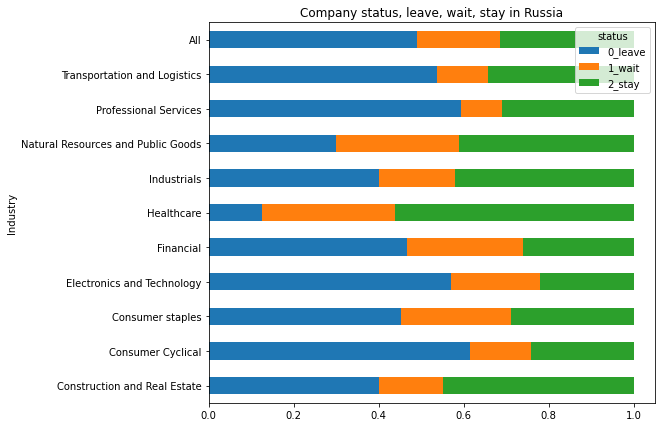

In [181]:
xtab = pd.crosstab(data.Industry, data.status, normalize='index',margins=True)
xtab.sort_values(by='0_leave', ascending=True)
myplot = xtab.plot(kind='barh', figsize = [8,7], stacked=True)
#plt.xlabel('Number of companies')
plt.title('Company status, leave, wait, stay in Russia')
# need to sort and 
# move labels to the side

In [182]:
# NATO
nato_xtab=pd.crosstab(data.nato, data['status'], normalize='index',margins=True)
nato_xtab.sort_values(by='0_leave', ascending=False)

status,0_leave,1_wait,2_stay
nato,,,
1,0.523652,0.200770,0.275578
All,0.489531,0.196399,0.314070
0,0.380702,0.182456,0.436842


<AxesSubplot:ylabel='nato'>

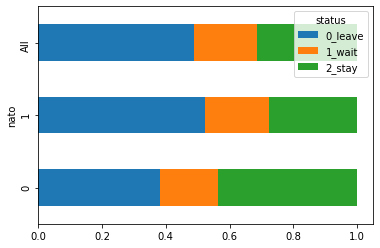

In [183]:
nato_xtab.plot.barh(rot=90, stacked=True)

In [184]:
sanctions_xtab=pd.crosstab(data.official_sanctions, data['status'], normalize='index',margins=True)
sanctions_xtab.sort_values(by='0_leave', ascending=False)

status,0_leave,1_wait,2_stay
official_sanctions,,,
1,0.520394,0.200656,0.278950
All,0.489531,0.196399,0.314070
0,0.231373,0.160784,0.607843


<AxesSubplot:ylabel='official_sanctions'>

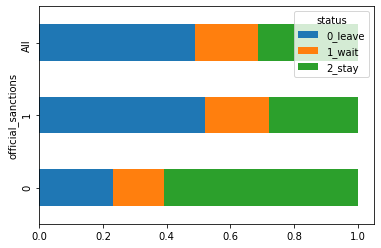

In [185]:
sanctions_xtab.plot.barh(rot=90, stacked=True)

In [186]:
# Russia Allies and Partners
rap_xtab=pd.crosstab(data.russia_ap, data['status'], normalize='index',margins=True)
rap_xtab.sort_values(by='0_leave', ascending=False)

status,0_leave,1_wait,2_stay
russia_ap,,,
0,0.515409,0.202322,0.282269
All,0.489531,0.196399,0.314070
1,0.100671,0.107383,0.791946


<AxesSubplot:ylabel='russia_ap'>

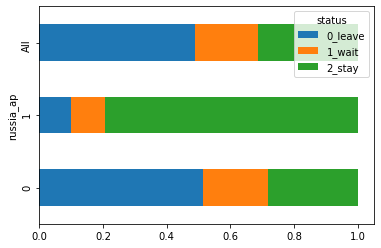

In [187]:
rap_xtab.plot.barh(rot=90, stacked=True)

In [188]:
#Revenue and staff data

data.groupby(['Industry']).agg({'RU_revenue':['mean', 'count'],
                                   'global_revenue':['mean', 'count'], 'staff':['mean', 'count'],}).round(2)

RU_revenue       global_revenue        \
                                         mean count           mean count   
Industry                                                                   
Construction and Real Estate           143.64    36       16389.71    36   
Consumer Cyclical                      397.26   191       19337.03   256   
Consumer staples                       609.15   108       22980.79   111   
Electronics and Technology             250.47   119       18657.83   211   
Financial                              335.79    19       26792.11   100   
Healthcare                             164.21    72       18063.01    74   
Industrials                             91.44   124       11732.34   142   
Natural Resources and Public Goods     219.25    51       47884.81   112   
Professional Services                  118.94    34        7185.31    57   
Transportation and Logistics            78.15    33       17345.83    58   

                                      staff        
                                       mean count  
Industry                                           
Construction and Real Estate         448.81    32  
Consumer Cyclical                   1993.77   183  
Consumer staples                    2454.91   103  
Electronics and Technology           789.12   106  
Financial                            584.68    22  
Healthcare                           436.86    65  
Industrials                          273.78   107  
Natural Resources and Public Goods   727.05    43  
Professional Services                792.39    38  
Transportation and Logistics         534.59    32

In [189]:
#Revenue data and staff data

data.groupby(['official_sanctions']).agg({'RU_revenue':['mean', 'count'],
                                   'global_revenue':['mean', 'count'], 'staff':['mean', 'count'],}).round(2)

RU_revenue       global_revenue          staff      
                         mean count           mean count     mean count
official_sanctions                                                     
0                      176.66    53       37105.03    95   331.08    51
1                      292.40   734       19739.72  1062  1246.87   680

<AxesSubplot:ylabel='Industry'>

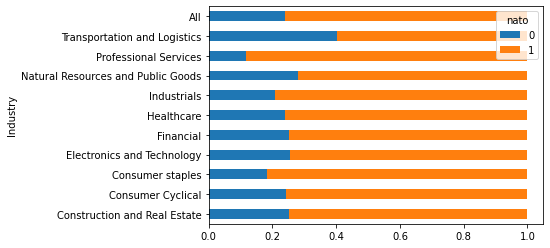

In [191]:
# Industry by NATO
in_xtab=pd.crosstab(data.Industry, data.nato, normalize='index',margins=True)
#in_xtab.sort_values(by='0_leave', ascending=False)
in_xtab.plot.barh(rot=0, stacked=True)

<AxesSubplot:xlabel='Industry'>

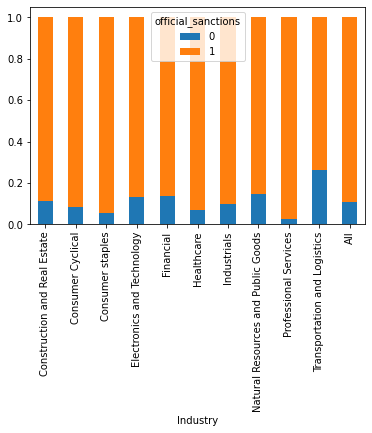

In [192]:
# Industry by Sanctions
s_xtab=pd.crosstab(data.Industry, data.official_sanctions, normalize='index',margins=True)
#s_xtab.sort_values(by='0_leave', ascending=False)
s_xtab.plot.bar(rot=90, stacked=True)

# Distributions

In [198]:
# Industry
ind_xtab=pd.crosstab(data.Industry, data['status'], normalize='index',margins=True)
ind_xtab.sort_values(by='0_leave', ascending=False)
ind_xtab

status,0_leave,1_wait,2_stay
Industry,,,
Construction and Real Estate,0.401869,0.149533,0.448598
Consumer Cyclical,0.614094,0.144295,0.241611
Consumer staples,0.453061,0.257143,0.289796
Electronics and Technology,0.571053,0.207895,0.221053
Financial,0.467337,0.271357,0.261307
Healthcare,0.125000,0.312500,0.562500
Industrials,0.400673,0.178451,0.420875
Natural Resources and Public Goods,0.300000,0.289474,0.410526
Professional Services,0.593103,0.096552,0.310345


# Working Dataset and Model Runs

#### Convert the status category to integers

In [199]:
def Classification(status):
    if status == '0_leave':
        return 0
    elif status == '1_wait':
        return 1
    elif status == '2_stay':
        return 2

    
data['status_int']=data['status'].apply(Classification)
data.head()

,name,country,Industry,description,date,status_current,status 3/17,status 3/24,status 3/31,status 4/7,status 4/14,status 4/21,status 4/28,status 5/5,status 5/12,status 5/19,status 5/29,status 6/2,status 6/9,status 6/16,status 6/23,status 6/30,status 7/31,status,staff,RU_revenue,global_revenue,RU_revenue_to_global,last_status_detailed,nato,official_sanctions,russia_ap,status_int
0,1Password,Canada,Financial,Halted creation of new accounts and renewal pa...,2022-03-15 00:00:00,Active,SCALING BACK – Reducing Current Operations/Hol...,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,SCALING BACK – Reducing Current Operations,1_wait,NaN,NaN,NaN,NaN,scaling back,1,1,0,1
1,3M,USA,Consumer staples,suspend operations in Russia,2022-03-31 00:00:00,Active,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,SUSPENSION – Keeping Options Open for Return,0_leave,809.0,220.0,35355.0,0.0062,suspension,1,1,0,0
2,Aalberts,Netherlands,Industrials,less than 11% of revenue from Russia,2022-03-31 00:00:00,Active,NaN,NaN,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,DIGGING IN – Defying Demands for Exit or Reduc...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,BUYING TIME – Holding Off New Investments/Deve...,1_wait,NaN,NaN,3149.5,NaN,buying time,1,1,0,1
3,Aarsleff,Denmark,Construction and Real Estate,have taken the decision to sell their business...,2022-03-31 00:00:00,Active,NaN,"WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clean Break - Surgical Removal, R...","WITHDRAWAL - Clea

## Model 1 (informed) and Model 2 (uninformed) 

We use industry dummies, company global revenues, and a dummy for official sanctions by country. Total number of observations is n=1157. We are running it with betas' having informed priors of st. dev. 1 and uninformed priors of st. dev 10. We are finding that a dummy for __healthcare__ and __official__ sanctions appear to be useful and with the expected sign in explaining companies decision to leave, stay, or wait to decide on their operations in Russia. 

### Select Variables and Drop NA

In [201]:
# normalize the continuous variables
# drop stuff
working_data = data[['status_int','Industry','global_revenue',
                'official_sanctions']]
working_data = working_data.dropna()
working_data.shape
working_data.head()

,status_int,Industry,global_revenue,official_sanctions
1,0,Consumer staples,35355.0,1
2,1,Industrials,3149.5,1
4,1,Electronics and Technology,2972.1,1
5,0,Consumer staples,54304.0,1
6,0,Electronics and Technology,28945.0,1


### Normalize the continuous variables

In [203]:
working_data.global_revenue=(working_data.global_revenue - np.mean(working_data.global_revenue))/np.std(working_data.global_revenue)

### Check dummy counts

In [204]:
pd.crosstab(working_data.Industry, working_data['status_int'],margins=True)
#ind_xtab.sort_values(by=working_data['status_int'], ascending=False)

status_int,0,1,2,All
Industry,,,,
Construction and Real Estate,15,9,12,36
Consumer Cyclical,171,45,40,256
Consumer staples,51,38,22,111
Electronics and Technology,137,41,33,211
Financial,51,30,19,100
Healthcare,9,30,35,74
Industrials,68,36,38,142
Natural Resources and Public Goods,39,38,35,112
Professional Services,41,10,6,57


### Convert Industry to Dummies

Consumer cyclical has relatively high leave rate.  Other industries should be interpreted relative to this.

In [205]:
working_data['Industry'] = working_data['Industry'].replace(['Consumer Cyclical'],'1_Consumer Cyclical')

In [206]:
industry_dum = pd.get_dummies(working_data['Industry'], drop_first=True)
working_data.drop(['Industry'], axis = 1, inplace=True)
working_data = pd.concat([working_data,industry_dum], axis = 1)
working_data.shape

(1157, 12)

### Run the Model 1 (informed priors)

In [207]:
y_obs = working_data['status_int']

x = working_data.drop(['status_int'], axis=1)

In [208]:
x.columns

Index(['global_revenue', 'official_sanctions', 'Construction and Real Estate',
       'Consumer staples', 'Electronics and Technology', 'Financial',
       'Healthcare', 'Industrials', 'Natural Resources and Public Goods',
       'Professional Services', 'Transportation and Logistics'],
      dtype='object')

1157 11


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_transport_logistics, beta_prof_services, beta_resources, beta_industrials, beta_healthcare, beta_financial, beta_tech, beta_consumer_staples, beta_construction, beta_sanct, beta_glrev, intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 129 seconds.


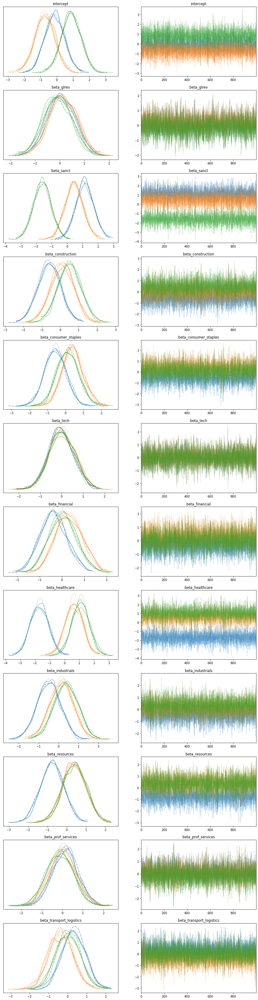

In [209]:
ndata = x.shape[0]  
nparam = x.shape[1] 
nclass = len(y_obs.unique()) 
print(ndata,nparam)

with pm.Model() as model_1:
    X_data = pm.Data('X_data', x)
    y_obs_data = pm.Data('y_obs_data', y_obs)

    intercept = pm.Normal('intercept', mu=0, sd=1, shape=nclass) 
    beta_glrev = pm.Normal('beta_glrev', mu=0, sd=1, shape=nclass)
    #beta_rrev_pct = pm.Normal('beta', mu=0, sd=1, shape=(nparam, nclass)) 
    #beta_nato = pm.Normal('beta', mu=0, sd=1, shape=(nparam, nclass)) 
    beta_sanct = pm.Normal('beta_sanct', mu=0, sd=1, shape=nclass) 
    #beta_russiaap = pm.Normal('beta', mu=0, sd=5, shape=(nparam, nclass)) 
    beta_ind1 = pm.Normal('beta_construction', mu=0, sd=1, shape=nclass) # Construction and Real Estate
    beta_ind2 = pm.Normal('beta_consumer_staples', mu=0, sd=1, shape=nclass) # Consumer staples
    beta_ind3 = pm.Normal('beta_tech', mu=0, sd=1, shape=nclass) # Electronics and Technology
    beta_ind4 = pm.Normal('beta_financial', mu=0, sd=1, shape=nclass) # Financial
    beta_ind5 = pm.Normal('beta_healthcare', mu=0, sd=1, shape=nclass) # Healthcare
    beta_ind6 = pm.Normal('beta_industrials', mu=0, sd=1, shape=nclass) # Industrials
    beta_ind7 = pm.Normal('beta_resources', mu=0, sd=1, shape=nclass) # Natural Resources and Public Goods
    beta_ind8 = pm.Normal('beta_prof_services', mu=0, sd=1, shape=nclass) # Professional Services
    beta_ind9 = pm.Normal('beta_transport_logistics', mu=0, sd=1, shape=nclass) # Transportation and Logistics
 
    beta = [beta_glrev, beta_sanct, beta_ind1, beta_ind2, beta_ind3, beta_ind4,
           beta_ind5, beta_ind6, beta_ind7, beta_ind8, beta_ind9]
    
#['global_revenue', 'official_sanctions', 'Construction and Real Estate',
#       'Consumer staples', 'Electronics and Technology', 'Financial',
#       'Healthcare', 'Industrials', 'Natural Resources and Public Goods',
#       'Professional Services', 'Transportation and Logistics']
    
    mu = tt.dot(X_data, beta) + intercept 

    p = tt.nnet.softmax(mu) 
    y = pm.Categorical('y', p=p, observed=y_obs_data)
    step = pm.NUTS(target_accept=0.95)  #relaxes the proposal acceptance threshold
    trace_1 = pm.sample()   
    idata_1 = az.from_pymc3(trace_1)
    pm.traceplot(idata_1, figsize=(15,60))

In [210]:
pd.set_option('display.max_rows', None)
pm.summary(trace_1)

Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept[0],-0.136,0.607,-1.227,1.038,0.009,0.010,4441.0,3272.0,1.0
intercept[1],-0.736,0.612,-1.948,0.362,0.009,0.007,4584.0,2832.0,1.0
intercept[2],0.887,0.603,-0.191,2.077,0.009,0.008,4485.0,2947.0,1.0
beta_glrev[0],0.045,0.574,-1.024,1.127,0.009,0.009,3924.0,2830.0,1.0
beta_glrev[1],0.125,0.572,-0.918,1.218,0.009,0.008,3979.0,2865.0,1.0
beta_glrev[2],-0.105,0.575,-1.144,0.991,0.009,0.009,3922.0,3035.0,1.0
beta_sanct[0],1.145,0.589,0.091,2.326,0.008,0.006,5369.0,2919.0,1.0
beta_sanct[1],0.448,0.595,-0.675,1.546,0.008,0.007,5284.0,3135.0,1.0
beta_sanct[2],-1.614,0.577,-2.679,-0.504,0.008,0.006,5074.0,3093.0,1.0
beta_construction[0],-0.603,0.615,-1.738,0.573,0.009,0.008,4462.0,3064.0,1.0


Got error No model on context stack. trying to find log_likelihood in translation.


array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

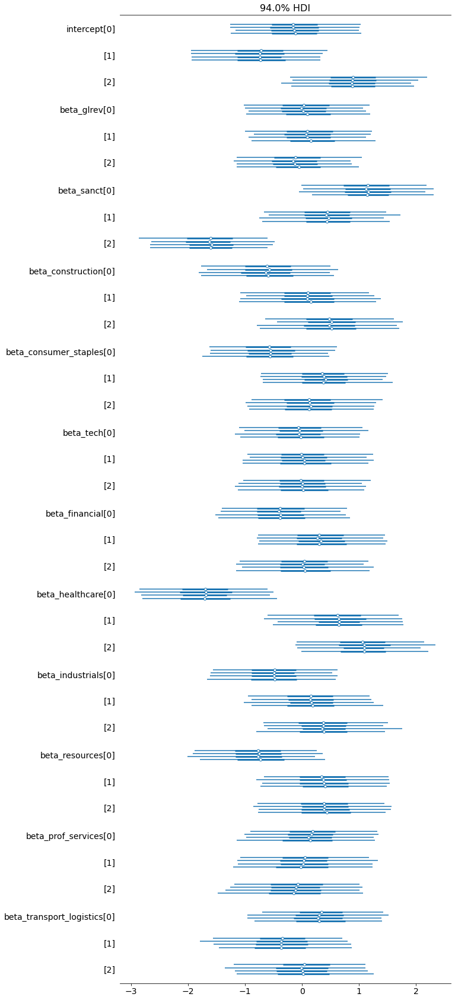

In [211]:
pm.plots.plot_forest(trace_1, figsize=(10,30))

In [212]:
with model_1:
    ppc = pm.sample_posterior_predictive(trace_1)
#https://docs.pymc.io/en/v3/pymc-examples/examples/diagnostics_and_criticism/posterior_predictive.html

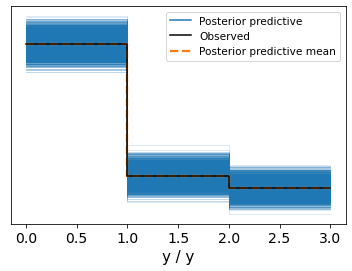

In [214]:
az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=model_1));

In [215]:
pm.waic(trace_1, model_1)

Got error No model on context stack. trying to find log_likelihood in translation.


Computed from 4000 posterior samples and 1157 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -1064.47    20.10
p_waic       22.61        -

### Run the Model 2 (uninformed priors) 

Standard Deviations are 10


1157 11


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_transport_logistics, beta_prof_services, beta_resources, beta_industrials, beta_healthcare, beta_financial, beta_tech, beta_consumer_staples, beta_construction, beta_sanct, beta_glrev, intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 905 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.
There were 111 divergences after tuning. Increase `target_accept` or reparameterize.


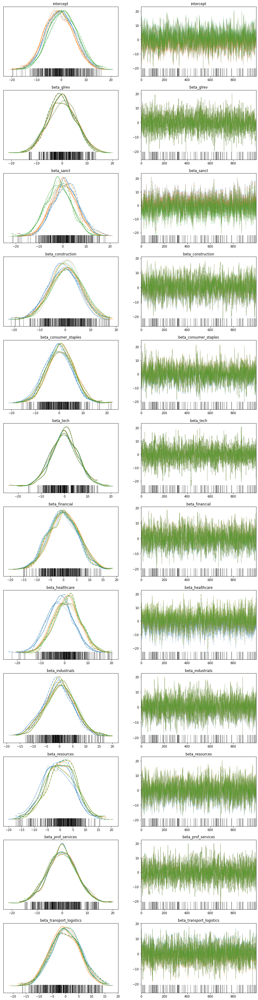

In [216]:
ndata = x.shape[0]  
nparam = x.shape[1] 
nclass = len(y_obs.unique()) 
print(ndata,nparam)

with pm.Model() as model_2:
    X_data = pm.Data('X_data', x)
    y_obs_data = pm.Data('y_obs_data', y_obs)

    intercept = pm.Normal('intercept', mu=0, sd=10, shape=nclass) 
    beta_glrev = pm.Normal('beta_glrev', mu=0, sd=10, shape=nclass)
    #beta_rrev_pct = pm.Normal('beta', mu=0, sd=1, shape=(nparam, nclass)) 
    #beta_nato = pm.Normal('beta', mu=0, sd=1, shape=(nparam, nclass)) 
    beta_sanct = pm.Normal('beta_sanct', mu=0, sd=10, shape=nclass) 
    #beta_russiaap = pm.Normal('beta', mu=0, sd=5, shape=(nparam, nclass)) 
    beta_ind1 = pm.Normal('beta_construction', mu=0, sd=10, shape=nclass) # Construction and Real Estate
    beta_ind2 = pm.Normal('beta_consumer_staples', mu=0, sd=10, shape=nclass) # Consumer staples
    beta_ind3 = pm.Normal('beta_tech', mu=0, sd=10, shape=nclass) # Electronics and Technology
    beta_ind4 = pm.Normal('beta_financial', mu=0, sd=10, shape=nclass) # Financial
    beta_ind5 = pm.Normal('beta_healthcare', mu=0, sd=10, shape=nclass) # Healthcare
    beta_ind6 = pm.Normal('beta_industrials', mu=0, sd=10, shape=nclass) # Industrials
    beta_ind7 = pm.Normal('beta_resources', mu=0, sd=10, shape=nclass) # Natural Resources and Public Goods
    beta_ind8 = pm.Normal('beta_prof_services', mu=0, sd=10, shape=nclass) # Professional Services
    beta_ind9 = pm.Normal('beta_transport_logistics', mu=0, sd=10, shape=nclass) # Transportation and Logistics
    
    beta = [beta_glrev, beta_sanct, beta_ind1, beta_ind2, beta_ind3, beta_ind4,
           beta_ind5, beta_ind6, beta_ind7, beta_ind8, beta_ind9]
    
#['global_revenue', 'official_sanctions', 'Construction and Real Estate',
#       'Consumer staples', 'Electronics and Technology', 'Financial',
#       'Healthcare', 'Industrials', 'Natural Resources and Public Goods',
#       'Professional Services', 'Transportation and Logistics']
    
    
    #error_sigma = pm.HalfCauchy('error_sigma',5)
    mu = tt.dot(X_data, beta) + intercept 

    p = tt.nnet.softmax(mu) 
    y = pm.Categorical('y', p=p, observed=y_obs_data)
    step = pm.NUTS(target_accept=0.95)  #relaxes the proposal acceptance threshold
    trace_2 = pm.sample()   
    idata_2 = az.from_pymc3(trace_2)
    pm.traceplot(idata_2, figsize=(15,60))

In [222]:
pm.summary(trace_2)

Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept[0],-0.328,5.789,-11.560,10.069,0.133,0.111,1902.0,1639.0,1.00
intercept[1],-0.991,5.788,-11.626,9.969,0.132,0.108,1909.0,1628.0,1.00
intercept[2],0.769,5.792,-9.969,11.624,0.133,0.114,1898.0,1765.0,1.00
beta_glrev[0],0.053,5.667,-10.330,10.731,0.142,0.106,1588.0,1738.0,1.00
beta_glrev[1],0.130,5.666,-10.244,10.758,0.142,0.106,1595.0,1701.0,1.00
beta_glrev[2],-0.110,5.665,-10.557,10.482,0.142,0.105,1588.0,1692.0,1.00
beta_sanct[0],1.205,5.676,-9.492,11.492,0.160,0.138,1303.0,1051.0,1.00
beta_sanct[1],0.497,5.692,-10.243,10.707,0.160,0.136,1305.0,1013.0,1.00
beta_sanct[2],-1.726,5.685,-12.491,8.526,0.161,0.126,1289.0,1099.0,1.00
beta_construction[0],-0.665,5.973,-12.301,10.241,0.155,0.128,1488.0,1471.0,1.00


Got error No model on context stack. trying to find log_likelihood in translation.


array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

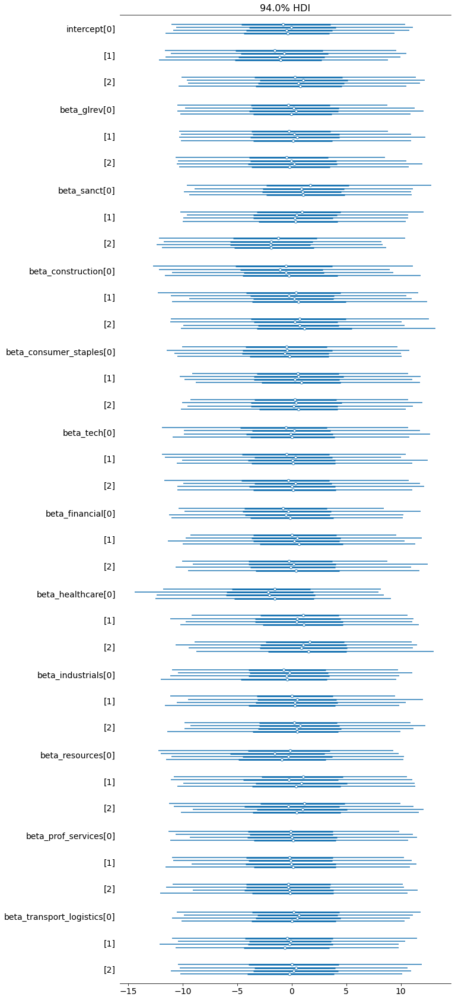

In [223]:
pm.plots.plot_forest(trace_2, figsize=(10,30))

In [224]:
with model_2:
    ppc = pm.sample_posterior_predictive(trace_2)

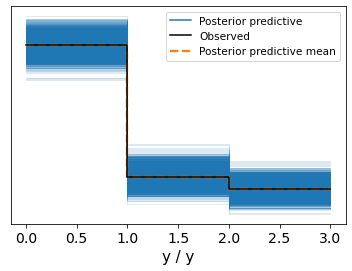

In [225]:
az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=model_2));

In [226]:
pm.waic(trace_2, model_2)

Got error No model on context stack. trying to find log_likelihood in translation.


Computed from 4000 posterior samples and 1157 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -1066.19    20.83
p_waic       24.87        -

## Model 3 (informed, small) and Model 4 (uninformed, small) 

We use a dummy for country with official sanctions against Russia, size of global revenues and the share of Russian revenues in total revenues. Sample size is much smaller wtih n= 484 as financial data is missing for many countries. This is should be a good area for future research. 

Due to the small sample size, we consolidate the industry breakdown further. 

We find that dummy for __official Sanctions__ and __healthcare__ are significant. 

We run our Model 3 with informed priors of st. dev 1 and Model 4 with uninformed priors of st. dev 10.

In [229]:
working_data = data[['status_int','Industry','global_revenue','RU_revenue_to_global', 
                'official_sanctions']]
working_data = working_data.dropna()
working_data.shape

(484, 5)

In [230]:
working_data.global_revenue=(working_data.global_revenue - np.mean(working_data.global_revenue))/np.std(working_data.global_revenue)

In [231]:
working_data.RU_revenue_to_global=\
(working_data.RU_revenue_to_global - np.mean(working_data.RU_revenue_to_global))/np.std(working_data.RU_revenue_to_global)

In [232]:
pd.crosstab(working_data.Industry, working_data['status_int'], margins=True)

status_int,0,1,2,All
Industry,,,,
Construction and Real Estate,5,4,5,14
Consumer Cyclical,81,22,16,119
Consumer staples,24,29,8,61
Electronics and Technology,42,20,21,83
Financial,7,2,2,11
Healthcare,5,25,21,51
Industrials,33,23,15,71
Natural Resources and Public Goods,9,18,10,37
Professional Services,14,5,2,21


In [233]:
# Consolidate industry dummies

industry_small={'Industry':{"Professional Services":"Business Enablers",
"Financial":"Business Enablers",
"Transportation and Logistics":"Business Enablers" ,
"Construction and Real Estate": "Industrials"                       }}

In [234]:
working_data=working_data.replace(industry_small)
working_data.Industry.value_counts()

Consumer Cyclical                     119
Industrials                            85
Electronics and Technology             83
Consumer staples                       61
Healthcare                             51
Business Enablers                      48
Natural Resources and Public Goods     37
Name: Industry, dtype: int64

In [235]:
working_data['Industry'] = working_data['Industry'].replace(['Consumer Cyclical'],'1_Consumer Cyclical')

industry_dum = pd.get_dummies(working_data['Industry'], drop_first=True)
working_data.drop(['Industry'], axis = 1, inplace=True)
working_data = pd.concat([working_data,industry_dum], axis = 1)
working_data.shape

(484, 10)

### Model 3 (informed, small)

In [236]:
y_obs = working_data['status_int']

x = working_data.drop(['status_int'], axis=1)

In [237]:
x.columns

Index(['global_revenue', 'RU_revenue_to_global', 'official_sanctions',
       'Business Enablers', 'Consumer staples', 'Electronics and Technology',
       'Healthcare', 'Industrials', 'Natural Resources and Public Goods'],
      dtype='object')

484 9


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_resources, beta_industrials, beta_healthcare, beta_tech, beta_consumer_stabples, beta_business_services, beta_sanct, beta_rrev_pct, beta_glrev, intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 79 seconds.


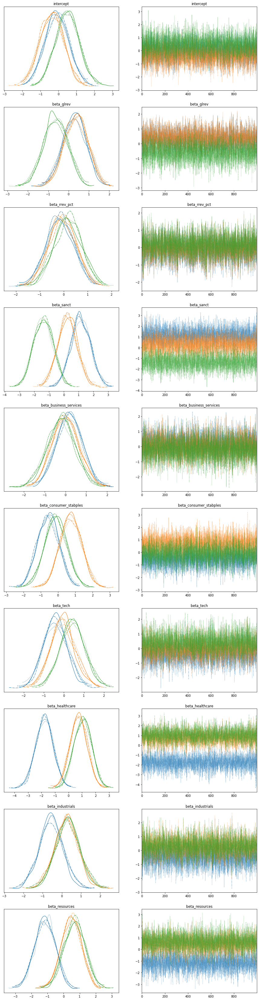

In [238]:
ndata = x.shape[0]  
nparam = x.shape[1] 
nclass = len(y_obs.unique()) 
print(ndata,nparam)

with pm.Model() as model_3:
    X_data = pm.Data('X_data', x)
    y_obs_data = pm.Data('y_obs_data', y_obs)

    intercept = pm.Normal('intercept', mu=0, sd=1, shape=nclass) 
    beta_glrev = pm.Normal('beta_glrev', mu=0, sd=1, shape=nclass)
    beta_rrev_pct = pm.Normal('beta_rrev_pct', mu=0, sd=1, shape=nclass) 
    beta_sanct = pm.Normal('beta_sanct', mu=0, sd=1, shape=nclass) 
    beta_ind1 = pm.Normal('beta_business_services', mu=0, sd=1, shape=nclass) # Business Enablers
    beta_ind2 = pm.Normal('beta_consumer_stabples', mu=0, sd=1, shape=nclass) # Consumer staples
    beta_ind3 = pm.Normal('beta_tech', mu=0, sd=1, shape=nclass) # Electronics and Technology
    beta_ind4 = pm.Normal('beta_healthcare', mu=0, sd=1, shape=nclass) # Healthcare
    beta_ind5 = pm.Normal('beta_industrials', mu=0, sd=1, shape=nclass) # Industrials
    beta_ind6 = pm.Normal('beta_resources', mu=0, sd=1, shape=nclass) # Natural Resources and Public Goods

    #beta_ind10 = pm.Normal('beta', mu=0, sd=5, shape=(nparam, nclass)) 
    #beta_ind11 = pm.Normal('beta', mu=0, sd=5, shape=(nparam, nclass)) 
    #error_sigma = pm.HalfCauchy('error_sigma',5)
    
    beta = [beta_glrev, beta_rrev_pct, beta_sanct, beta_ind1, beta_ind2, beta_ind3, beta_ind4,
           beta_ind5, beta_ind6]
    
    mu = tt.dot(X_data, beta) + intercept 

    p = tt.nnet.softmax(mu) 
    y = pm.Categorical('y', p=p, observed=y_obs_data)
    step = pm.NUTS(target_accept=0.95)  #relaxes the proposal acceptance threshold
    trace_3 = pm.sample()   
    idata_3 = az.from_pymc3(trace_3)
    pm.traceplot(idata_3, figsize=(15,60))

In [239]:
pd.set_option('display.max_rows', None)
pm.summary(trace_3)

Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept[0],-0.086,0.667,-1.312,1.206,0.010,0.010,4269.0,2764.0,1.0
intercept[1],-0.374,0.662,-1.630,0.856,0.010,0.009,4259.0,2738.0,1.0
intercept[2],0.499,0.656,-0.755,1.715,0.010,0.009,4458.0,3065.0,1.0
beta_glrev[0],0.295,0.582,-0.868,1.296,0.010,0.009,3217.0,2947.0,1.0
beta_glrev[1],0.367,0.583,-0.737,1.426,0.010,0.008,3307.0,2780.0,1.0
beta_glrev[2],-0.638,0.596,-1.781,0.416,0.010,0.008,3667.0,2696.0,1.0
beta_rrev_pct[0],-0.152,0.580,-1.256,0.906,0.010,0.009,3583.0,2626.0,1.0
beta_rrev_pct[1],-0.050,0.575,-1.125,1.008,0.010,0.009,3587.0,2739.0,1.0
beta_rrev_pct[2],0.174,0.578,-0.957,1.203,0.010,0.009,3565.0,2646.0,1.0
beta_sanct[0],1.142,0.665,-0.082,2.415,0.010,0.008,4119.0,3004.0,1.0


Got error No model on context stack. trying to find log_likelihood in translation.


array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

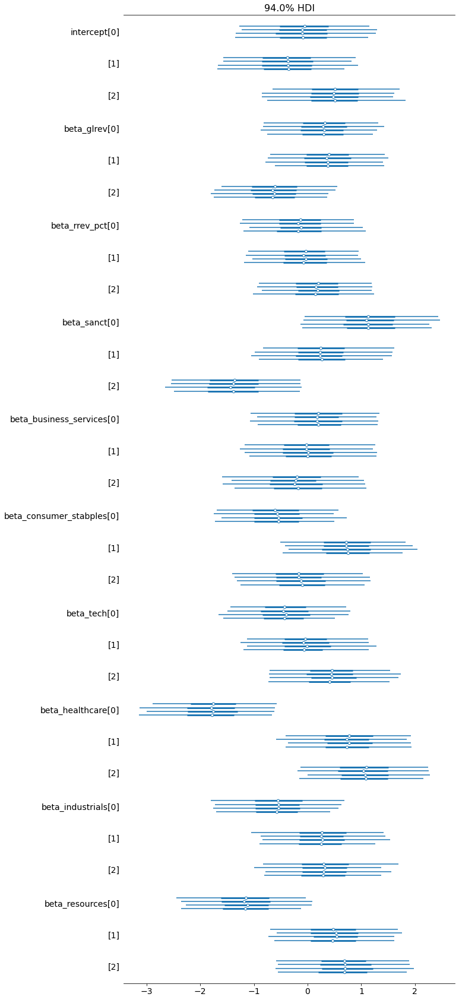

In [240]:
pm.plots.plot_forest(trace_3, figsize=(10,30))

In [241]:
with model_3:
    ppc = pm.sample_posterior_predictive(trace_3)
#https://docs.pymc.io/en/v3/pymc-examples/examples/diagnostics_and_criticism/posterior_predictive.html

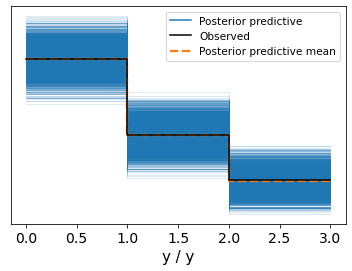

In [242]:
az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=model_3));

In [243]:
pm.waic(trace_3, model_3)

Got error No model on context stack. trying to find log_likelihood in translation.


Computed from 4000 posterior samples and 484 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -453.52    11.82
p_waic       18.92        -

There has been a warning during the calculation. Please check the results.

###  Model 4 (uninformed, small) 
Uninformed Priors: Standard Deviation =10

484 9


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_resources, beta_industrials, beta_healthcare, beta_tech, beta_consumer_stabples, beta_business_services, beta_sanct, beta, beta_glrev, intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 483 seconds.


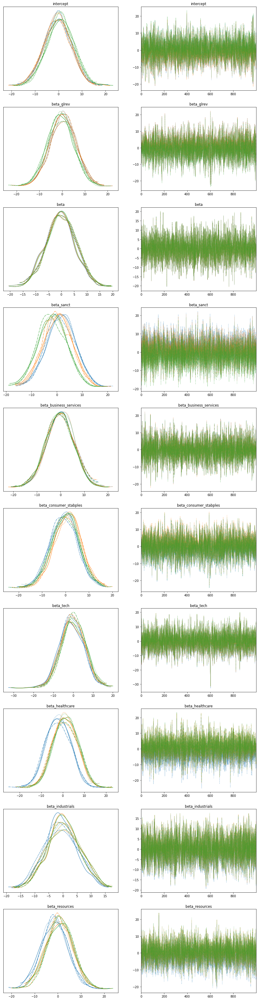

In [244]:
ndata = x.shape[0]  
nparam = x.shape[1] 
nclass = len(y_obs.unique()) 
print(ndata,nparam)

with pm.Model() as model_4:
    X_data = pm.Data('X_data', x)
    y_obs_data = pm.Data('y_obs_data', y_obs)

    intercept = pm.Normal('intercept', mu=0, sd=10, shape=nclass) 
    beta_glrev = pm.Normal('beta_glrev', mu=0, sd=10, shape=nclass)
    beta_rrev_pct = pm.Normal('beta', mu=0, sd=10, shape=nclass) 
    beta_sanct = pm.Normal('beta_sanct', mu=0, sd=10, shape=nclass) 
    beta_ind1 = pm.Normal('beta_business_services', mu=0, sd=10, shape=nclass) # Business Enablers
    beta_ind2 = pm.Normal('beta_consumer_stabples', mu=0, sd=10, shape=nclass) # Consumer staples
    beta_ind3 = pm.Normal('beta_tech', mu=0, sd=10, shape=nclass) # Electronics and Technology
    beta_ind4 = pm.Normal('beta_healthcare', mu=0, sd=10, shape=nclass) # Healthcare
    beta_ind5 = pm.Normal('beta_industrials', mu=0, sd=10, shape=nclass) # Industrials
    beta_ind6 = pm.Normal('beta_resources', mu=0, sd=10, shape=nclass) # Natural Resources and Public Goods

    beta = [beta_glrev, beta_rrev_pct, beta_sanct, beta_ind1, beta_ind2, beta_ind3, beta_ind4,
           beta_ind5, beta_ind6]

    mu = tt.dot(X_data, beta) + intercept 

    p = tt.nnet.softmax(mu) 
    y = pm.Categorical('y', p=p, observed=y_obs_data)
    step = pm.NUTS(target_accept=0.95)  #relaxes the proposal acceptance threshold
    trace_4 = pm.sample()   
    idata_4 = az.from_pymc3(trace_4)
    pm.traceplot(idata_4, figsize=(15,60))

In [245]:
pm.summary(trace_4)

Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept[0],-0.374,5.868,-11.234,10.912,0.085,0.106,4723.0,2834.0,1.0
intercept[1],-0.487,5.859,-11.108,10.904,0.086,0.107,4653.0,2830.0,1.0
intercept[2],0.750,5.857,-10.030,11.770,0.086,0.106,4670.0,2692.0,1.0
beta_glrev[0],0.406,5.845,-10.765,11.202,0.090,0.109,4295.0,2699.0,1.0
beta_glrev[1],0.463,5.844,-10.309,11.697,0.089,0.110,4299.0,2657.0,1.0
beta_glrev[2],-0.683,5.846,-11.824,10.164,0.089,0.109,4295.0,2575.0,1.0
beta[0],-0.217,5.790,-11.278,10.301,0.091,0.102,4051.0,2568.0,1.0
beta[1],-0.102,5.790,-10.825,10.742,0.091,0.102,4055.0,2501.0,1.0
beta[2],0.123,5.790,-10.858,10.725,0.091,0.102,4062.0,2534.0,1.0
beta_sanct[0],1.562,5.732,-9.024,12.540,0.089,0.091,4180.0,2952.0,1.0


Got error No model on context stack. trying to find log_likelihood in translation.


array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

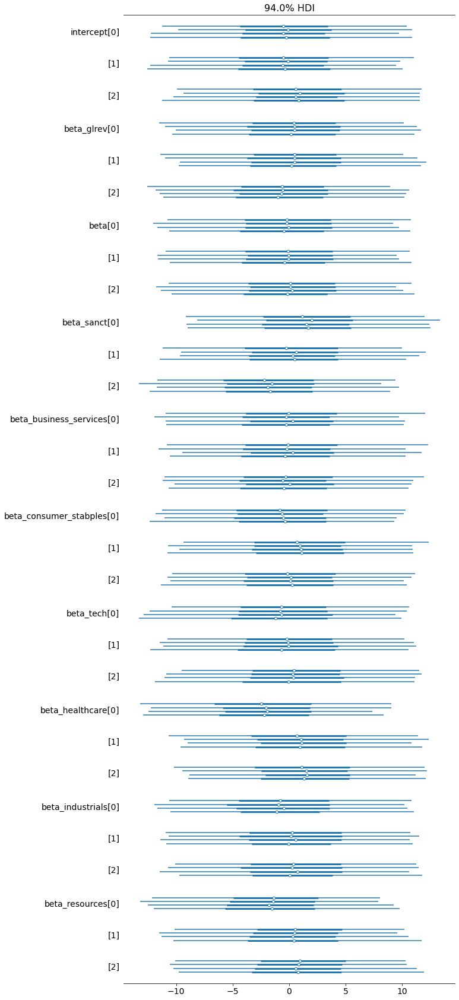

In [246]:
pm.plots.plot_forest(trace_4, figsize=(10,30))

In [247]:
with model_4:
    ppc = pm.sample_posterior_predictive(trace_4)
#https://docs.pymc.io/en/v3/pymc-examples/examples/diagnostics_and_criticism/posterior_predictive.html

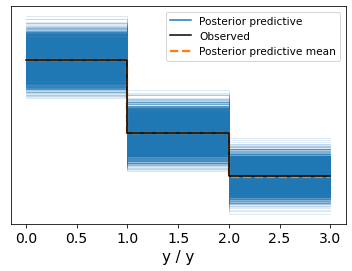

In [248]:
az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=model_4));

In [249]:
pm.waic(trace_4, model_4)

Got error No model on context stack. trying to find log_likelihood in translation.


Computed from 4000 posterior samples and 484 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -455.64    13.11
p_waic       22.59        -

There has been a warning during the calculation. Please check the results.

# Diagnostics of models 1 - 2 (ER add more if works)

In [251]:
cmp1_df = az.compare({'model_1':trace_1, 'model_2':trace_2}, 
                    method = 'BB-pseudo-BMA')

cmp1_df 

Got error No model on context stack. trying to find log_likelihood in translation.
Got error No model on context stack. trying to find log_likelihood in translation.


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
model_1,0,-1064.541847,22.678346,0.00000,0.79637,19.917303,0.000000,False,log
model_2,1,-1066.268417,24.948316,1.72657,0.20363,20.685514,1.189032,False,log


<AxesSubplot:xlabel='Log'>

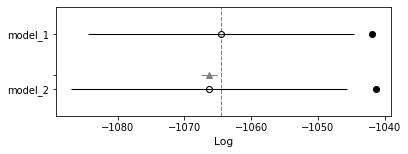

In [252]:
az.plot_compare(cmp1_df)

In [253]:
cmp2_df = az.compare({'model_3':trace_3, 'model_4':trace_4}, 
                    method = 'BB-pseudo-BMA')

cmp2_df 

Got error No model on context stack. trying to find log_likelihood in translation.
Got error No model on context stack. trying to find log_likelihood in translation.


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
model_3,0,-453.605638,19.005387,0.000000,0.794593,11.878871,0.000000,False,log
model_4,1,-455.845446,22.796875,2.239809,0.205407,13.171952,2.071792,False,log


<AxesSubplot:xlabel='Log'>

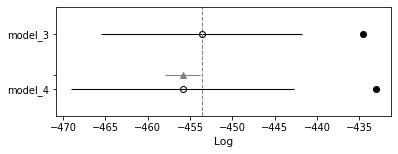

In [254]:
az.plot_compare(cmp2_df)

## Model 5 (binary response variable, stay+wait vs leave, informed)

In [263]:
working_data = data[['status_int','Industry','global_revenue',
                'official_sanctions']]
working_data = working_data.dropna()
working_data.shape

(1157, 4)

In [264]:
working_data.global_revenue=(working_data.global_revenue - np.mean(working_data.global_revenue))/np.std(working_data.global_revenue)

In [265]:
working_data['Industry'] = working_data['Industry'].replace(['Consumer Cyclical'],'1_Consumer Cyclical')

In [266]:
industry_dum = pd.get_dummies(working_data['Industry'], drop_first=True)
working_data.drop(['Industry'], axis = 1, inplace=True)
working_data = pd.concat([working_data,industry_dum], axis = 1)
working_data.shape

(1157, 12)

In [267]:
binary_data = working_data

binary_data['status_int'].replace({2 : 1}, inplace=True)
binary_data.head()

,status_int,global_revenue,official_sanctions,Construction and Real Estate,Consumer staples,Electronics and Technology,Financial,Healthcare,Industrials,Natural Resources and Public Goods,Professional Services,Transportation and Logistics
1,0,0.336827,1,0,1,0,0,0,0,0,0,0
2,1,-0.427663,1,0,0,0,0,0,1,0,0,0
4,1,-0.431874,1,0,0,1,0,0,0,0,0,0
5,0,0.786635,1,0,1,0,0,0,0,0,0,0
6,0,0.184667,1,0,0,1,0,0,0,0,0,0


In [268]:
binary_data = binary_data.rename(columns={"Construction and Real Estate": "con_real", "Consumer staples": "con_st", 
                                          "Electronics and Technology": "elec_tech", "Natural Resources and Public Goods": 
                                          "nat_pub", "Professional Services": "prof_serv", "Transportation and Logistics": "trans_log"})

In [269]:
binary_data.head()

,status_int,global_revenue,official_sanctions,con_real,con_st,elec_tech,Financial,Healthcare,Industrials,nat_pub,prof_serv,trans_log
1,0,0.336827,1,0,1,0,0,0,0,0,0,0
2,1,-0.427663,1,0,0,0,0,0,1,0,0,0
4,1,-0.431874,1,0,0,1,0,0,0,0,0,0
5,0,0.786635,1,0,1,0,0,0,0,0,0,0
6,0,0.184667,1,0,0,1,0,0,0,0,0,0


The glm module is deprecated and will be removed in version 4.0
We recommend to instead use Bambi https://bambinos.github.io/bambi/
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [trans_log, prof_serv, nat_pub, Industrials, Healthcare, Financial, elec_tech, con_st, con_real, official_sanctions, global_revenue, Intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.
Got error No model on context stack. trying to find log_likelihood in translation.
Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,1.076,0.277,0.547,1.578,0.005,0.004,3067.0,2601.0,1.0
global_revenue,0.005,0.068,-0.125,0.129,0.001,0.001,5658.0,2347.0,1.0
official_sanctions,-1.836,0.268,-2.317,-1.324,0.004,0.003,3635.0,2891.0,1.0
con_real,0.842,0.350,0.232,1.540,0.005,0.004,4684.0,2648.0,1.0
con_st,0.830,0.226,0.415,1.259,0.004,0.003,3881.0,2962.0,1.0
elec_tech,0.042,0.191,-0.309,0.410,0.003,0.003,3325.0,2750.0,1.0
Financial,0.560,0.234,0.083,0.959,0.004,0.003,3724.0,2962.0,1.0
Healthcare,2.429,0.345,1.805,3.099,0.005,0.004,4761.0,2451.0,1.0
Industrials,0.716,0.205,0.338,1.109,0.003,0.002,3587.0,3056.0,1.0
nat_pub,1.113,0.244,0.653,1.583,0.004,0.003,3620.0,2451.0,1.0


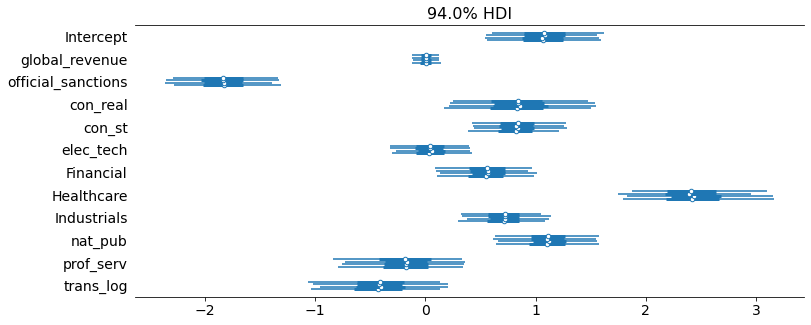

In [270]:
my_priors = {"Intercept": pm.Normal.dist(mu=0, sd=1),
               "global_revenue": pm.Normal.dist(mu=0, sd=1),
               "official_sanctions": pm.Normal.dist(mu=0, sd=1),
               "con_real": pm.Normal.dist(mu=0, sd=1),
               "con_st": pm.Normal.dist(mu=0, sd=1),
               "elec_tech": pm.Normal.dist(mu=0, sd=1),
               "Financial": pm.Normal.dist(mu=0, sd=1),
               "Healthcare": pm.Normal.dist(mu=0, sd=1),
               "Industrials": pm.Normal.dist(mu=0, sd=1),
               "nat_pub": pm.Normal.dist(mu=0, sd=1),
               "prof_serv": pm.Normal.dist(mu=0, sd=1),
               "trans_log": pm.Normal.dist(mu=0, sd=1)
              }

with pm.Model() as model:
    pm.glm.GLM.from_formula(formula = 'status_int ~ global_revenue + official_sanctions + con_real + con_st + elec_tech + Financial + Healthcare + Industrials + nat_pub + prof_serv + trans_log', 
                            data = binary_data, 
                            priors = my_priors,
                            family = pm.glm.families.Binomial())

    trace = pm.sample(1000)

# 'Construction and Real Estate',
#       'Consumer staples', 'Electronics and Technology', 'Financial',
#       'Healthcare', 'Industrials', 'Natural Resources and Public Goods',
#       'Professional Services', 'Transportation and Logistics'    

#You can obtain forest plots with:
pm.plots.forestplot(trace, figsize = (12,5))

#You can get a table of summary statistics out using:
pm.summary(trace)